### **DATA COLLECTION**

In [297]:
!pip install sidetable
import sidetable
import pandas as pd #pandas
import numpy as np #module
import seaborn as sns #to visualize
import matplotlib.pyplot as plt #for plotting
from bs4 import BeautifulSoup
import requests
import warnings
warnings.filterwarnings("ignore")

In [298]:
df = pd.read_csv("https://github.com/washingtonpost/data-police-shootings/releases/download/v0.1/fatal-police-shootings-data.csv")

In [299]:
df1 = pd.read_csv("https://raw.githubusercontent.com/tonmcg/US_County_Level_Election_Results_08-20/master/2016_US_County_Level_Presidential_Results.csv")
df3= pd.read_csv("https://raw.githubusercontent.com/jasonong/List-of-US-States/master/states.csv")

In [300]:
print("Fatal shooting dataset has {}".format(df.shape[0]),
"rows and {}".format(df.shape[1]), "columns")
df.head(2)

Fatal shooting dataset has 5887 rows and 17 columns


,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True


In [301]:
print("Fatal shooting dataset has {}".format(df1.shape[0]),
"rows and {}".format(df1.shape[1]), "columns")
df1.head(2)

Fatal shooting dataset has 3141 rows and 11 columns


,Unnamed: 0,votes_dem,votes_gop,total_votes,per_dem,per_gop,diff,per_point_diff,state_abbr,county_name,combined_fips
0,0,93003.0,130413.0,246588.0,0.377159,0.52887,"37,410",15.17%,AK,Alaska,2013
1,1,93003.0,130413.0,246588.0,0.377159,0.52887,"37,410",15.17%,AK,Alaska,2016


In [302]:
df3=df3.rename(columns = {'Abbreviation':'state', 'State':'state_name'})
df3.head(3)

,state_name,state
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ


### **DATA CLEANING**

In [303]:
df= df.join(df3.set_index('state'), on='state')
df.head(3)

,id,name,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,body_camera,longitude,latitude,is_geocoding_exact,state_name
0,3,Tim Elliot,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,False,-123.122,47.247,True,Washington
1,4,Lewis Lee Lembke,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,False,-122.892,45.487,True,Oregon
2,5,John Paul Quintero,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,False,-97.281,37.695,True,Kansas


In [304]:
df.body_camera.value_counts()

False    5154
True      733
Name: body_camera, dtype: int64

In [305]:
df.drop(['id','name', 'body_camera'], axis=1, inplace=True)
df.head(2)

,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,longitude,latitude,is_geocoding_exact,state_name
0,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,-123.122,47.247,True,Washington
1,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,-122.892,45.487,True,Oregon


In [306]:
df.isna().sum()

date                         0
manner_of_death              0
armed                      212
age                        253
gender                       1
race                       546
city                         0
state                        0
signs_of_mental_illness      0
threat_level                 0
flee                       324
longitude                  288
latitude                   288
is_geocoding_exact           0
state_name                   0
dtype: int64

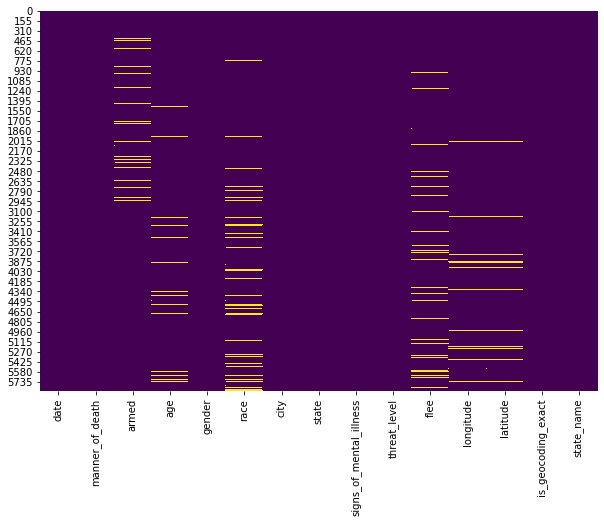

In [307]:
plt.figure(figsize=(10,7))
sns.heatmap(df.isnull(), cbar = False, cmap = 'viridis')

In [308]:
df.flee.value_counts()

Not fleeing    3645
Car             967
Foot            759
Other           192
Name: flee, dtype: int64

In [309]:
df.armed.value_counts()

gun                    3369
knife                   861
unarmed                 374
toy weapon              195
undetermined            174
                       ... 
grenade                   1
hand torch                1
barstool                  1
bean-bag gun              1
car, knife and mace       1
Name: armed, Length: 95, dtype: int64

In [310]:
df.armed.fillna(df.armed.value_counts().index[0], inplace=True)
df.flee.fillna('Not fleeing', inplace=True)

In [311]:
df.dropna(axis=0, how='any', inplace=True)
print("There are {}".format(df.isna().sum().sum()), "missing values left in the dataframe")

There are 0 missing values left in the dataframe


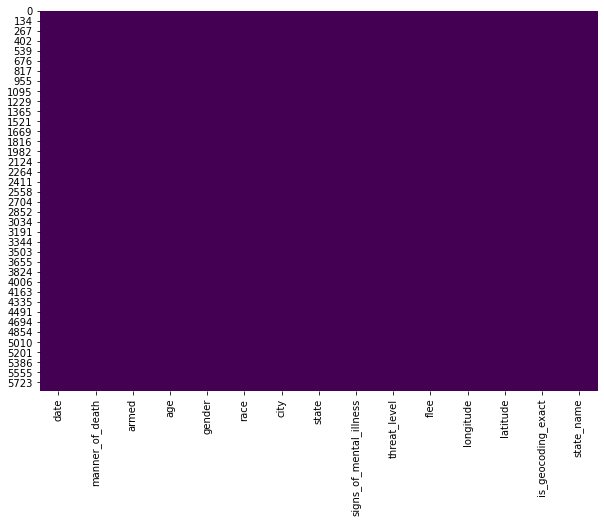

In [312]:
plt.figure(figsize=(10,7))
sns.heatmap(df.isnull(), cbar = False, cmap = 'viridis')

In [313]:
locationInfo = df.copy() 

In [314]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = pd.to_datetime(df['date']).dt.year
df['month'] = pd.to_datetime(df['date']).dt.month
df['h_yr'] = np.where(df['month'] > 6, 2, 1)

In [315]:
df.insert(2, 'Count_h_yr', df.groupby(['year','h_yr','state'])['year'].transform('size'))
df.insert(2, 'Count_per_year', df.groupby(['year','state'])['year'].transform('size'))

In [316]:
df['h_yr']= df['year'].astype(int)*10 + df['h_yr'].astype(int)
df.head(2)

,date,manner_of_death,Count_per_year,Count_h_yr,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,longitude,latitude,is_geocoding_exact,state_name,year,month,h_yr
0,2015-01-02,shot,16,8,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,-123.122,47.247,True,Washington,2015,1,20151
1,2015-01-02,shot,14,8,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,-122.892,45.487,True,Oregon,2015,1,20151


### **STATE WISE DATA KILL**

In [317]:
kill_st=df.groupby(['state']).size().reset_index(name='counts')
kill_st.head(3)

,state,counts
0,AK,31
1,AL,90
2,AR,60


In [318]:
df1.drop(['Unnamed: 0','total_votes','per_dem','per_gop','diff','per_point_diff','combined_fips','county_name'], axis=1, inplace=True)
df1=df1.rename(columns = {'state_abbr':'state'})

In [319]:
df1= df1.join(df3.set_index('state'), on='state')
df1.head(3)

,votes_dem,votes_gop,state,state_name
0,93003.0,130413.0,AK,Alaska
1,93003.0,130413.0,AK,Alaska
2,93003.0,130413.0,AK,Alaska


In [320]:
df1 = df1.groupby(['state']).agg({'votes_dem' : 'sum', 'votes_gop': 'sum'}).reset_index()
df1['pol_m'] = np.where(df1['votes_dem'] > df1['votes_gop'], "Blue", "Red")

In [321]:
by_state = pd.DataFrame()
by_state= pd.merge(df1, kill_st, on='state')
by_state= by_state.join(df3.set_index('state'), on='state')

In [322]:
by_state.head()

,state,votes_dem,votes_gop,pol_m,counts,state_name
0,AK,2697087.0,3781977.0,Red,31,Alaska
1,AL,718084.0,1306925.0,Red,90,Alabama
2,AR,378729.0,677904.0,Red,60,Arkansas
3,AZ,936250.0,1021154.0,Red,224,Arizona
4,CA,7362490.0,3916209.0,Blue,723,California


### **DATASET BY STATE AND TIME**

In [323]:
df2= df.copy()
df2 = df2.drop(['manner_of_death','date','month','armed','age','gender','race','city','signs_of_mental_illness','threat_level','flee','longitude','latitude','is_geocoding_exact'], 1)

In [324]:
# dropping duplicate values 
df2= df2.drop_duplicates(['year','state'],keep= 'last')
df2.reset_index(inplace=True)
df2.drop(['index'], axis=1, inplace=True)

In [325]:
df2= df2.sort_values(['state_name'])

In [326]:
df2.tail(10)

,Count_per_year,Count_h_yr,state,state_name,year,h_yr
20,11,6,WI,Wisconsin,2015,20152
129,21,9,WI,Wisconsin,2017,20172
56,16,7,WI,Wisconsin,2016,20162
219,15,9,WI,Wisconsin,2019,20192
22,5,4,WY,Wyoming,2015,20152
128,1,1,WY,Wyoming,2017,20172
54,2,2,WY,Wyoming,2016,20161
265,1,1,WY,Wyoming,2020,20202
205,1,1,WY,Wyoming,2019,20192
155,3,1,WY,Wyoming,2018,20182


### **DATA VISUALIZATION**

### **BY IDENTITY**

### **BY STATE**

In [327]:
##run a for loop to make seperate dataframes based on yearID and use Seaborn to plot them

by_state.set_index('state_name', inplace=True)

In [328]:
by_state.head()

,state,votes_dem,votes_gop,pol_m,counts
state_name,,,,,
Alaska,AK,2697087.0,3781977.0,Red,31
Alabama,AL,718084.0,1306925.0,Red,90
Arkansas,AR,378729.0,677904.0,Red,60
Arizona,AZ,936250.0,1021154.0,Red,224
California,CA,7362490.0,3916209.0,Blue,723


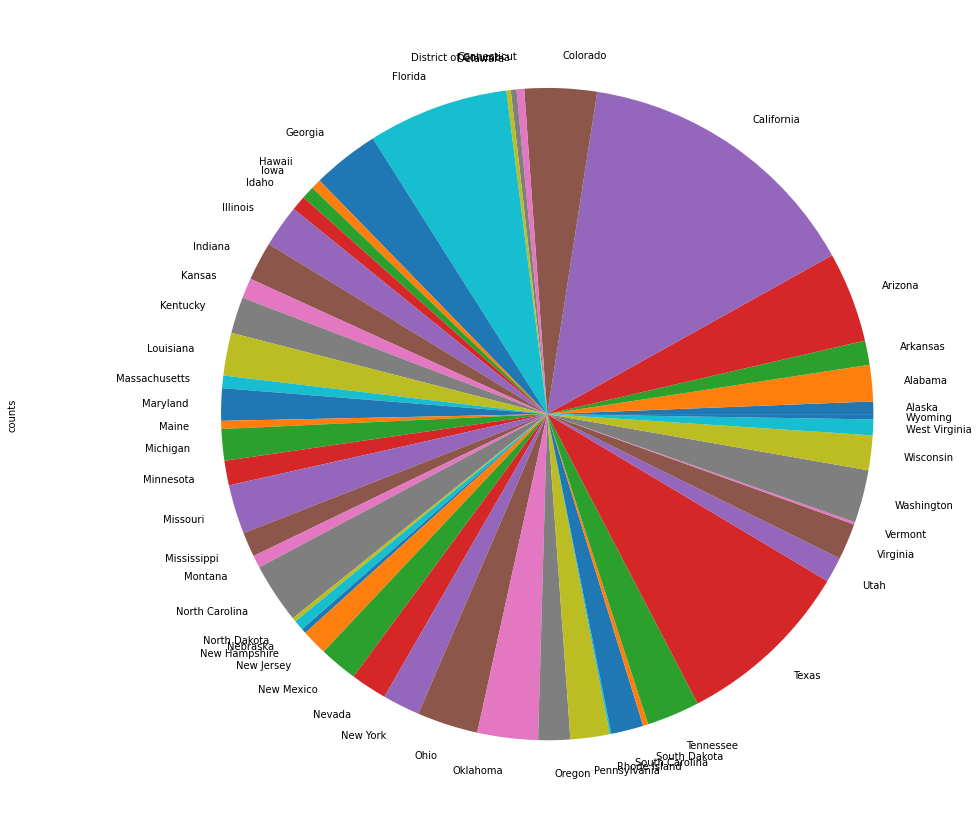

In [329]:
ax=by_state['counts'].plot(kind='pie', figsize=(20, 15))
ax.set_aspect('equal')
ax.yaxis.set_label_coords(-0.15, 0.5)
plt.show()

In [330]:
year_rate = df2.pivot(index='year', columns='state_name', values='Count_per_year')

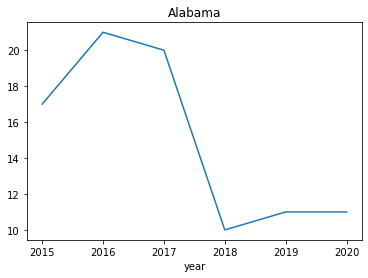

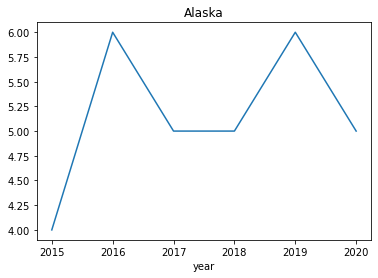

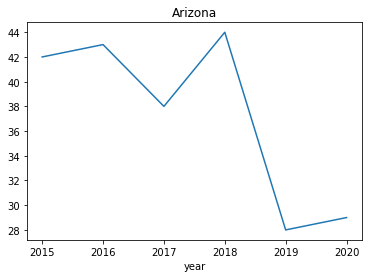

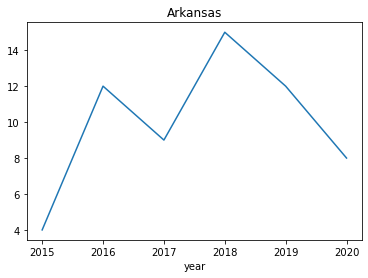

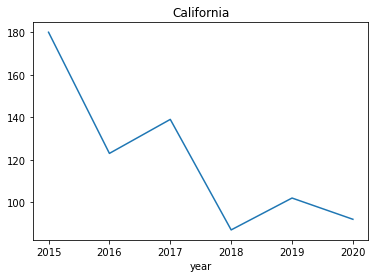

...

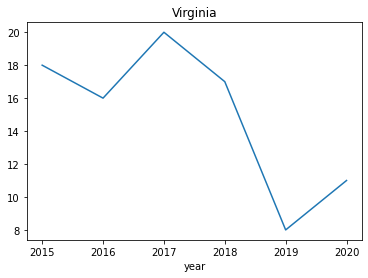

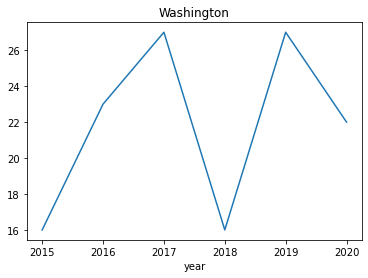

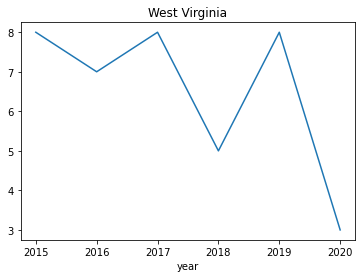

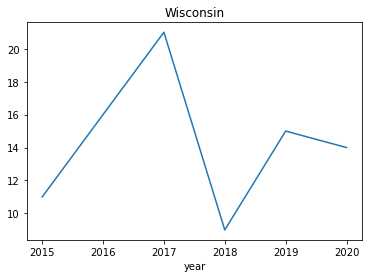

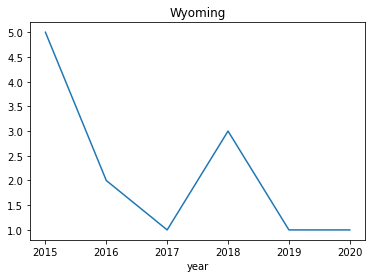

In [331]:
for i, col in enumerate(year_rate.columns):
    year_rate[col].plot(fig=plt.figure(i))
    plt.title(col)

plt.show()

In [332]:
df.stb.freq(['state'], thresh=50)

,state,count,percent,cumulative_count,cumulative_percent
0,CA,723,14.451329,723,14.451329
1,TX,441,8.814711,1164,23.266040
2,FL,349,6.975815,1513,30.241855
3,AZ,224,4.477314,1737,34.719168
4,CO,179,3.577853,1916,38.297022
5,GA,166,3.318009,2082,41.615031
6,OH,151,3.018189,2233,44.633220
7,OK,150,2.998201,2383,47.631421
8,others,2620,52.368579,5003,100.000000


### **BY POLITICAL AFFILIATION**

In [ ]:
by_pol= by_state.groupby(['pol_m']).agg({'counts' : 'sum'}).reset_index()
by_pol.reset_index(drop=True)

,pol_m,counts
0,Blue,1932
1,Red,3069


Text(0, 0.5, 'Fatal Police Shooting')

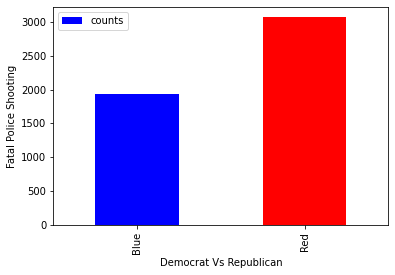

In [ ]:
br= by_pol.plot(kind='bar',x='pol_m',y='counts', 
        color=["blue","red"]) 
br.set_xlabel("Democrat Vs Republican")
br.set_ylabel("Fatal Police Shooting")

### **BY EXACT LATITUDE AND LONGITUDE**

In [274]:
import folium
from folium import plugins
from folium.plugins import HeatMap

In [275]:
locationInfo.head(3)

,date,manner_of_death,armed,age,gender,race,city,state,signs_of_mental_illness,threat_level,flee,longitude,latitude,is_geocoding_exact,state_name
0,2015-01-02,shot,gun,53.0,M,A,Shelton,WA,True,attack,Not fleeing,-123.122,47.247,True,Washington
1,2015-01-02,shot,gun,47.0,M,W,Aloha,OR,False,attack,Not fleeing,-122.892,45.487,True,Oregon
2,2015-01-03,shot and Tasered,unarmed,23.0,M,H,Wichita,KS,False,other,Not fleeing,-97.281,37.695,True,Kansas


In [276]:
def per_race(r):
    color = ''
    if r == 'B':
        color = 'black'
    elif r == 'W':
        color = 'white'
    elif r == 'U':
        color = 'green'
    elif r == 'A':
        color = 'yellow'
    elif r == 'O':
        color = 'blue'
    elif r == 'H':
        color = 'purple'
    elif r == 'N':
        color = 'crimson'
    return color

In [277]:
map_PoliceKillings = folium.Map()
cluster = folium.plugins.MarkerCluster(name="Fatal Police Shooting").add_to(map_PoliceKillings)

In [278]:
for person in locationInfo.itertuples():
    lat = person.latitude
    long = person.longitude
    if person.gender == 'M':
        sex_c= 'blue'
    else:
        sex_c= 'pink'
        
    race_c= per_race(person.race)
        
    sex = "Sex: {} ".format(person.gender)
    age = "Age: {}".format(person.age)
    race = "Race: {} ".format(person.race)
    armed = "Armed status {} ".format(person.armed)
    
    content = sex + "\n" + age + "\n"+ race  + "\n" + armed
        
    newMarker = folium.Marker([lat,long], popup=content, icon=folium.Icon(color=sex_c,icon_color=race_c)) 
    newMarker.add_to(cluster)
        

In [279]:
map_PoliceKillings

### **EXAMINING LOCATION VS AGE**

In [292]:
dfChildren = locationInfo[locationInfo['age'] < 18]
print("No.of Children- ",dfChildren.shape[0])
#433 kids dead

dfYoungAdult = locationInfo[locationInfo['age'] >= 18]
dfYoungAdult = dfYoungAdult[dfYoungAdult['age'] <= 29]
print("No.of Young adults- ",dfYoungAdult.shape[0])
#1893 young adults 19-29  dead

dfMiddleAged = locationInfo[locationInfo['age'] > 29]
dfMiddleAged = dfMiddleAged[dfMiddleAged['age'] <= 39]
print("No.of Middle aged adults-" ,dfMiddleAged.shape[0])
#1893 young adults 19-29  dead

dfOlder = locationInfo[locationInfo['age'] > 39]
dfOlder = dfOlder[dfOlder['age'] <= 49]
print("No.of Middle old adults-" ,dfOlder.shape[0])
#1366 Older people aged 39-49 dead

dfOldest = locationInfo[locationInfo['age'] > 49]
print("No.of Middle oldest adults-" ,dfOldest.shape[0])
#1366 Oldest people aged 50 and over dead

No.of Children-  99
No.of Young adults-  1601
No.of Middle aged adults- 1524
No.of Middle old adults- 924
No.of Middle oldest adults- 855


In [ ]:
map_PoliceKillings = folium.Map()
heat_data = [[row['latitude'],row['longitude']] for index,row in dfChildren.iterrows()]
HeatMap(heat_data,radius=25).add_to(map_PoliceKillings)


for index,row in dfChildren.iterrows():
    color = ''
    color = per_race(row['race'])'
    folium.CircleMarker(radius = 5,
      location = [row['latitude'],row['longitude']],
      popup=row['manner_of_death'],
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7
).add_to(map_PoliceKillings)


map_PoliceKillings

In [ ]:
dfChildren.race.value_counts()
# MORE BLACK MINORS WERE KILLED THAN WHITE MINORS

In [ ]:
map_PoliceKillings = folium.Map()
heat_data = [[row['latitude'],row['longitude']] for index,row in dfYoungAdult.iterrows()]
HeatMap(heat_data,radius=25).add_to(map_PoliceKillings)


for index,row in dfYoungAdult.iterrows():
    color = ''
    color = per_race(row['race'])'
    folium.CircleMarker(radius = 5,
      location = [row['latitude'],row['longitude']],
      popup=row['manner_of_death'],
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7
).add_to(map_PoliceKillings)


map_PoliceKillings

In [281]:
dfYoungAdult.race.value_counts()

B    496
W    492
H    292
N     29
A     18
O     15
Name: race, dtype: int64

In [284]:

map_PoliceKillings = folium.Map()
heat_data = [[row['latitude'],row['longitude']] for index,row in dfMiddleAged.iterrows()]
HeatMap(heat_data,radius=25).add_to(map_PoliceKillings)


for index,row in dfMiddleAged.iterrows():
    color = ''
    color = per_race(row['race'])
    folium.CircleMarker(radius = 5,
      location = [row['latitude'],row['longitude']],
      popup=row['manner_of_death'],
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7
).add_to(map_PoliceKillings)


map_PoliceKillings

In [285]:
dfMiddleAged.race.value_counts()

W    669
B    373
H    291
A     29
N     27
O     13
Name: race, dtype: int64

In [288]:

map_PoliceKillings = folium.Map()
heat_data = [[row['latitude'],row['longitude']] for index,row in dfOlder.iterrows()]
HeatMap(heat_data,radius=25).add_to(map_PoliceKillings)


for index,row in dfOlder.iterrows():
    color = ''
    color = per_race(row['race'])
    folium.CircleMarker(radius = 5,
      location = [row['latitude'],row['longitude']],
      popup=row['manner_of_death'],
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7
).add_to(map_PoliceKillings)


map_PoliceKillings

In [289]:
dfOlder.race.value_counts()

W    628
B    118
H     87
A     14
O      4
N      4
Name: race, dtype: int64

In [293]:
map_PoliceKillings = folium.Map()
heat_data = [[row['latitude'],row['longitude']] for index,row in dfOldest.iterrows()]
HeatMap(heat_data,radius=25).add_to(map_PoliceKillings)


for index,row in dfOldest.iterrows():
    color = ''
    color = per_race(row['race'])
    folium.CircleMarker(radius = 5,
      location = [row['latitude'],row['longitude']],
      popup=row['manner_of_death'],
      color=color,
      fill=True,
      fill_color=color,
      fill_opacity=0.7
).add_to(map_PoliceKillings)


map_PoliceKillings

In [294]:
dfOldest.race.value_counts()

W    628
B    118
H     87
A     14
O      4
N      4
Name: race, dtype: int64

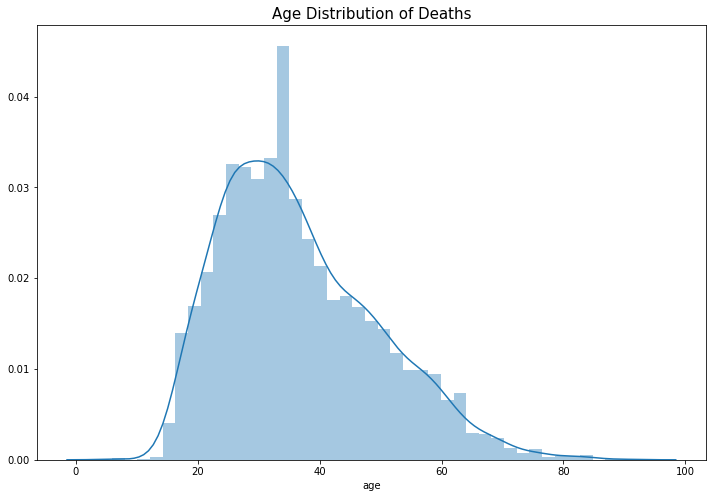

In [295]:
plt.figure(figsize=(12,8))
plt.title('Age Distribution of Deaths', fontsize=15)
sns.distplot(df.age)

### BY Race Specefic

In [333]:
df_pop = pd.DataFrame({'race':['W','B','A','H','N','O'],
'population':[0.601, 0.134, 0.059, 0.185, 0.013, 0.008]})
df_pop['population'] = df_pop['population']*328
df_pop

,race,population
0,W,197.128
1,B,43.952
2,A,19.352
3,H,60.680
4,N,4.264
5,O,2.624


In [338]:
df_race = df[['race','year','armed']].groupby(['race','year']).count().reset_index()
df_race.rename(columns={'armed':'number_of_deaths'}, inplace=True)
df_race.head(4)

,race,year,number_of_deaths
0,A,2015,13
1,A,2016,14
2,A,2017,14
3,A,2018,18


In [339]:
df_race = pd.merge(df_race, df_pop, on='race')
df_race['deaths_per_million'] = df_race['number_of_deaths'] / df_race['population']
df_race.head()

,race,year,number_of_deaths,population,deaths_per_million
0,A,2015,13,19.352,0.671765
1,A,2016,14,19.352,0.723439
2,A,2017,14,19.352,0.723439
3,A,2018,18,19.352,0.930136
4,A,2019,18,19.352,0.930136


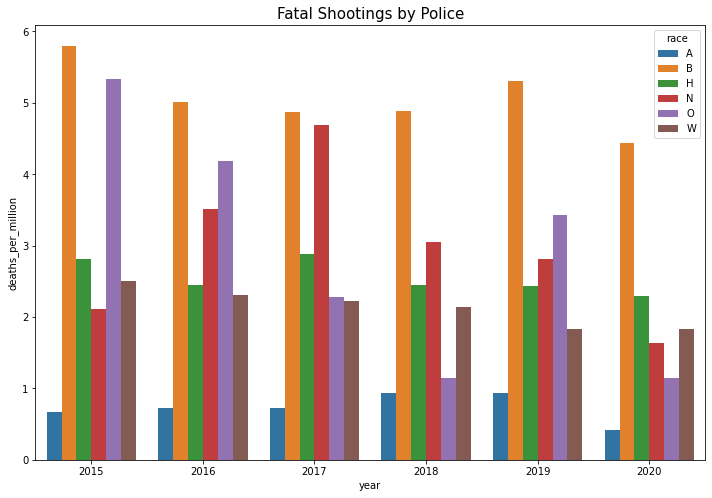

In [340]:
plt.figure(figsize=(12,8))
plt.title("Fatal Shootings by Police", fontsize=15)
sns.barplot(x='year', y='deaths_per_million', hue='race', data=df_race )